In [97]:
import pandas as pd
import json
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor


# Imports ML
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.datasets import make_classification
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.dummy import DummyClassifier

# Otimizando os modelos de machine learning
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import f1_score
import pickle



pd.options.mode.chained_assignment = None  # default='warn'

# Importando

Iniciando os tratamentos dos dados pela importação e normalização das informações, ajustando as colunas e tendo uma visão inicial do dataset

In [2]:
data = json.load(open('DadosColetados/Details/top100/top_100.json'))
data_norm = pd.json_normalize(data)
data_norm.head()

,id,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,start_season.year,start_season.season,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users
0,28735,Shouwa Genroku Rakugo Shinjuu,2016-01-09,2016-04-02,Yotarou is a former yakuza member fresh out of...,8.56,104,839,292917,94892,...,2016,winter,saturday,02:25,19676,105721,12529,8842,146145,292913
1,820,Ginga Eiyuu Densetsu,1988-01-08,1997-03-17,The 150-year-long stalemate between the two in...,9.02,9,744,324066,79752,...,1988,winter,NaN,NaN,34296,72807,19970,8667,188320,324060
2,15417,Gintama': Enchousen,2012-10-04,2013-03-28,"While Gintoki Sakata was away, the Yorozuya fo...",9.02,10,739,326907,166175,...,2012,fall,thursday,18:00,11100,210484,3784,2985,98547,326900
3,43608,Kaguya-sama wa Kokurasetai: Ultra Romantic,2022-04-09,2022-06-25,The elite members of Shuchiin Academy's studen...,9.01,12,175,937147,529216,...,2022,spring,saturday,00:00,90460,611817,13544,9666,211643,937130
4,42938,Fruits Basket: The Final,2021-04-06,2021-06-29,"Hundreds of years ago, the Chinese zodiac spir...",8.97,14,470,482265,239185,...,2021,spring,tuesday,01:30,34498,285753,6793,4867,150342,482253


In [3]:
data_sort = data_norm.sort_values(by=['rank'], ignore_index=True)
data_sort.head()

,id,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,start_season.year,start_season.season,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users
0,52991,Sousou no Frieren,2023-09-29,2024-03-22,During their decade-long quest to defeat the D...,9.36,1,256,764897,419474,...,2023,fall,friday,23:00,222964,364222,11670,7885,158077,764818
1,5114,Fullmetal Alchemist: Brotherhood,2009-04-05,2010-07-04,After a horrific alchemy experiment goes wrong...,9.09,2,3,3359773,2128919,...,2009,spring,sunday,17:00,260058,2428678,113035,59559,498399,3359729
2,9253,Steins;Gate,2011-04-06,2011-09-14,Eccentric scientist Rintarou Okabe has a never...,9.07,3,13,2574435,1405352,...,2011,spring,wednesday,02:05,168047,1615173,89510,56248,645408,2574386
3,28977,Gintama°,2015-04-08,2016-03-30,"Gintoki, Shinpachi, and Kagura return as the f...",9.06,4,343,633834,252437,...,2015,spring,wednesday,18:00,68906,265532,24673,18926,255788,633825
4,38524,Shingeki no Kyojin Season 3 Part 2,2019-04-29,2019-07-01,Seeking to restore humanity's diminishing hope...,9.05,5,21,2291242,1596894,...,2019,spring,monday,00:10,79765,2064129,9329,7541,130442,2291206


# Tratamento

Após a importação se inicia o tratamento, para isso é necessário verificar todos os tipos de colunas, além de valores estranhos e valores nulos, assim que identificados, serão tratados, limpando e ajustando as informações.

Como poucos valores foram identificados como anormais, a opção foi por tratar individualmente de cada, os mesmo vale para os valores nulos.

In [4]:
data_sort.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 39 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               100 non-null    int64  
 1   title                            100 non-null    object 
 2   start_date                       100 non-null    object 
 3   end_date                         98 non-null     object 
 4   synopsis                         100 non-null    object 
 5   mean                             100 non-null    float64
 6   rank                             100 non-null    int64  
 7   popularity                       100 non-null    int64  
 8   num_list_users                   100 non-null    int64  
 9   num_scoring_users                100 non-null    int64  
 10  nsfw                             100 non-null    object 
 11  created_at                       100 non-null    object 
 12  updated_at             

In [5]:
data_sort.isnull().sum()

id                                  0
title                               0
start_date                          0
end_date                            2
synopsis                            0
mean                                0
rank                                0
popularity                          0
num_list_users                      0
num_scoring_users                   0
nsfw                                0
created_at                          0
updated_at                          0
media_type                          0
status                              0
genres                              0
num_episodes                        0
source                              0
average_episode_duration            0
rating                              0
pictures                            0
background                          0
studios                             0
ingestion_time                      0
main_picture.medium                 0
main_picture.large                  0
alternative_

In [6]:
value_1 = 52991
value_100 = 28735

 
result = data_sort.loc[data_sort['id'] == value_100]
#result


In [7]:
data_sort[data_sort['end_date'].isnull()]

,id,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,start_season.year,start_season.season,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users
50,21,One Piece,1999-10-20,NaN,Barely surviving in a barrel after passing thr...,8.72,51,19,2371258,1348115,...,1999,fall,sunday,09:30,1681981,32,281318,189214,218634,2371179
87,39894,Hibike! Euphonium 3,2024-04-07,NaN,"With the ensemble contest behind them, the mem...",8.60,91,2892,58584,6548,...,2024,spring,sunday,17:00,21706,4,510,303,36059,58582


In [8]:
idx = data_sort[data_sort['end_date'].isnull()].index
#idx

In [9]:
#data_sort[data_sort['end_date'].isnull()] = data_sort['end_date'].apply(lambda x: 'present')
#data_sort[data_sort['end_date'].isnull()]

data_sort.loc[idx, 'end_date'] = 'present'
#data_sort.loc[idx, 'end_date']

In [10]:
data_sort[data_sort['broadcast.day_of_the_week'].isnull()]

,id,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,start_season.year,start_season.season,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users
5,39486,Gintama: The Final,2021-01-08,2021-01-08,Two years have passed following the Tendoshuu'...,9.04,6,1532,151985,72940,...,2021,winter,NaN,NaN,6915,83402,1613,1455,58596,151981
8,820,Ginga Eiyuu Densetsu,1988-01-08,1997-03-17,The 150-year-long stalemate between the two in...,9.02,9,744,324066,79752,...,1988,winter,NaN,NaN,34296,72807,19970,8667,188320,324060
16,28851,Koe no Katachi,2016-09-17,2016-09-17,"As a wild youth, elementary school student Sho...",8.93,17,20,2342937,1623250,...,2016,summer,NaN,NaN,49973,2012027,6495,3296,271098,2342889
20,15335,Gintama Movie 2: Kanketsu-hen - Yorozuya yo Ei...,2013-07-06,2013-07-06,When Gintoki apprehends a movie pirate at a pr...,8.90,21,1008,241908,135980,...,2013,summer,NaN,NaN,5464,171574,1797,1759,61311,241905
21,51535,Shingeki no Kyojin: The Final Season - Kankets...,2023-03-04,2023-11-05,In the wake of Eren Yeager's cataclysmic actio...,8.89,22,322,654409,380159,...,2023,winter,NaN,NaN,121933,381520,9231,2934,138777,654395
24,37987,Violet Evergarden Movie,2020-09-18,2020-09-18,Several years have passed since the end of The...,8.87,25,354,616030,279051,...,2020,summer,NaN,NaN,17407,357116,5026,1932,234541,616022
25,35247,Owarimonogatari 2nd Season,2017-08-12,2017-08-13,Following an encounter with oddity specialist ...,8.87,26,575,401068,193442,...,2017,summer,NaN,NaN,15961,243283,5370,2744,133697,401055
27,32281,Kimi no Na wa.,2016-08-26,2016-08-26,"Mitsuha Miyamizu, a high school girl, yearns t...",8.84,28,11,2755541,1911023,...,2016,summer,NaN,NaN,62420,2385290,7189,3925,296670,2755494
33,31758,Kizumonogatari III: Reiketsu-hen,2017-01-06,2017-01-06,After helping revive the legendary vampire Kis...,8.78,34,489,464749,270874,...,2017,winter,NaN,NaN,11213,340185,2988,1552,108801,464739
38,52198,Kaguya-sama wa Kokurasetai: First Kiss wa Owar...,2022-12-17,2022-12-17,"After their first kiss, Kaguya Shinomiya and M...",8.77,39,912,269321,146988,...,2022,fall,NaN,NaN,9405,183360,1995,623,73928,269311


In [11]:
idx = data_sort[data_sort['broadcast.day_of_the_week'].isnull()].index
#idx

In [12]:
data_sort.loc[idx, 'broadcast.day_of_the_week'] = 'friday'
#data_sort.loc[idx, 'broadcast.day_of_the_week']

In [13]:
data_sort[data_sort['broadcast.start_time'].isnull()]

,id,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,start_season.year,start_season.season,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users
5,39486,Gintama: The Final,2021-01-08,2021-01-08,Two years have passed following the Tendoshuu'...,9.04,6,1532,151985,72940,...,2021,winter,friday,NaN,6915,83402,1613,1455,58596,151981
8,820,Ginga Eiyuu Densetsu,1988-01-08,1997-03-17,The 150-year-long stalemate between the two in...,9.02,9,744,324066,79752,...,1988,winter,friday,NaN,34296,72807,19970,8667,188320,324060
16,28851,Koe no Katachi,2016-09-17,2016-09-17,"As a wild youth, elementary school student Sho...",8.93,17,20,2342937,1623250,...,2016,summer,friday,NaN,49973,2012027,6495,3296,271098,2342889
20,15335,Gintama Movie 2: Kanketsu-hen - Yorozuya yo Ei...,2013-07-06,2013-07-06,When Gintoki apprehends a movie pirate at a pr...,8.90,21,1008,241908,135980,...,2013,summer,friday,NaN,5464,171574,1797,1759,61311,241905
21,51535,Shingeki no Kyojin: The Final Season - Kankets...,2023-03-04,2023-11-05,In the wake of Eren Yeager's cataclysmic actio...,8.89,22,322,654409,380159,...,2023,winter,friday,NaN,121933,381520,9231,2934,138777,654395
24,37987,Violet Evergarden Movie,2020-09-18,2020-09-18,Several years have passed since the end of The...,8.87,25,354,616030,279051,...,2020,summer,friday,NaN,17407,357116,5026,1932,234541,616022
25,35247,Owarimonogatari 2nd Season,2017-08-12,2017-08-13,Following an encounter with oddity specialist ...,8.87,26,575,401068,193442,...,2017,summer,friday,NaN,15961,243283,5370,2744,133697,401055
27,32281,Kimi no Na wa.,2016-08-26,2016-08-26,"Mitsuha Miyamizu, a high school girl, yearns t...",8.84,28,11,2755541,1911023,...,2016,summer,friday,NaN,62420,2385290,7189,3925,296670,2755494
33,31758,Kizumonogatari III: Reiketsu-hen,2017-01-06,2017-01-06,After helping revive the legendary vampire Kis...,8.78,34,489,464749,270874,...,2017,winter,friday,NaN,11213,340185,2988,1552,108801,464739
38,52198,Kaguya-sama wa Kokurasetai: First Kiss wa Owar...,2022-12-17,2022-12-17,"After their first kiss, Kaguya Shinomiya and M...",8.77,39,912,269321,146988,...,2022,fall,friday,NaN,9405,183360,1995,623,73928,269311


In [14]:
idx = data_sort[data_sort['broadcast.start_time'].isnull()].index
#idx

In [15]:
data_sort.loc[idx, 'broadcast.start_time'] = '21:00'
#data_sort.loc[idx, 'broadcast.start_time']

In [16]:
value_1 = 'ona'

 
result = data_sort.loc[data_sort['media_type'] == value_1]
#result

In [17]:
data_sort.loc[result.index, 'media_type'] = 'ova'
#data_sort.loc[idx,'media_type']

In [18]:
data_sort.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 39 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   id                               100 non-null    int64  
 1   title                            100 non-null    object 
 2   start_date                       100 non-null    object 
 3   end_date                         100 non-null    object 
 4   synopsis                         100 non-null    object 
 5   mean                             100 non-null    float64
 6   rank                             100 non-null    int64  
 7   popularity                       100 non-null    int64  
 8   num_list_users                   100 non-null    int64  
 9   num_scoring_users                100 non-null    int64  
 10  nsfw                             100 non-null    object 
 11  created_at                       100 non-null    object 
 12  updated_at             

# Ajustes

Após o tratamento inicial, foi identificado quais colunas não acrescentam nenhuma ou pouca informação que possa ser útil para as análises seguintes e portanto essas foram retiradas do dataset

In [19]:
data_sort.drop(['created_at', 'updated_at', 'alternative_titles.synonyms', 'alternative_titles.ja', 'pictures', 'ingestion_time', 'main_picture.medium', 'main_picture.large'], axis=1, inplace=True)
data_sort = data_sort.rename(columns={"id": "index"})

In [20]:
data_sort_genre = data_sort.explode('genres').reset_index(drop=True)

# Normalizar a coluna 'data' para transformar dicionários em colunas
df_normalized = pd.concat([data_sort_genre.drop(['genres'], axis=1), pd.json_normalize(data_sort_genre['genres'])], axis=1)
df_normalized.drop(['id'], axis=1, inplace=True)
df_normalized = df_normalized.rename(columns={"name": "genres"})

In [21]:
df_normalized_backup = df_normalized.copy()

In [22]:
data_sort_studio = df_normalized.explode('studios').reset_index(drop=True)

# Normalizar a coluna 'data' para transformar dicionários em colunas
df_normalized = pd.concat([data_sort_studio.drop(['studios'], axis=1), pd.json_normalize(data_sort_studio['studios'])], axis=1)
df_normalized.drop(['id'], axis=1, inplace=True)
df_normalized = df_normalized.rename(columns={"name": "studios"})
df_normalized.drop_duplicates(subset=['index'], keep='first', inplace=True, ignore_index=True)

In [23]:
colunas = ['index', 'title', 'start_date', 'end_date', 'mean', 'rank', 'nsfw', 'media_type', 'status', 'genres', 'num_episodes', 'source', 'studios', 'alternative_titles.en', 'start_season.year', 'start_season.season', 'broadcast.day_of_the_week']

for col in colunas:
    print(f'Coluna: {col}:')
    print(df_normalized[col].unique())
    print('-'*100)
    

Coluna: index:
[52991  5114  9253 28977 38524 39486  9969 11061   820 15417 41467 43608
 34096 42938   918  4181 28851 35180  2904 54492 15335 51535    19 37491
 37987 35247 55690 32281 51009 40682 36838 49387 37510 31758 40028 47917
 32935   263 52198   199 17074 48583 45649 37521     1 47778 50160 53223
 44074 24701    21  2921 48569 33095 50172    44  1575 53998   245 21939
 50399 33352  5258 33050   431   164   457 45576 46102 34599 52034 54898
 11665 23273 40591 41084  2001 35760 34591 22135  1535 28891 36862 40748
  7311 42310 19647 39894    33 28957 38329  3786  4565 40456 31757 10379
 12355 37991 32983 28735]
----------------------------------------------------------------------------------------------------
Coluna: title:
['Sousou no Frieren' 'Fullmetal Alchemist: Brotherhood' 'Steins;Gate'
 'Gintama°' 'Shingeki no Kyojin Season 3 Part 2' 'Gintama: The Final'
 "Gintama'" 'Hunter x Hunter (2011)' 'Ginga Eiyuu Densetsu'
 "Gintama': Enchousen" 'Bleach: Sennen Kessen-hen'
 'Kaguya

In [24]:
df_normalized_backup = df_normalized.copy()

In [26]:
#Faltando 54, 61, 79
# 54
df_normalized.loc[df_normalized['alternative_titles.en'] == 'Descending Stories: Showa Genroku Rakugo Shinju']

,index,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users,genres,studios
53,33095,Shouwa Genroku Rakugo Shinjuu: Sukeroku Futata...,2017-01-07,2017-03-25,Even after having risen to the utmost rank of ...,8.71,55,1279,188527,65842,...,saturday,02:25,11321,75623,5903,3985,91692,188524,Adult Cast,Studio Deen


In [27]:
# 61
# data_sort.loc[data_sort['alternative_titles.en'] == 'The Founder of Diabolism Season 3']
df_normalized.loc[df_normalized['rank'] == 104]

,index,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users,genres,studios
99,28735,Shouwa Genroku Rakugo Shinjuu,2016-01-09,2016-04-02,Yotarou is a former yakuza member fresh out of...,8.56,104,839,292917,94892,...,saturday,02:25,19676,105721,12529,8842,146145,292913,Drama,Studio Deen


In [28]:
# 79
#data_sort.loc[data_sort['alternative_titles.en'] == 'Link Click Season 2']

In [29]:
#df_normalized.loc[df_normalized['rank'] == 55]


In [30]:
def addOne(v):
        v += 1
        return v

#for i in range(53, 104):
    #print(df_normalized.loc[df_normalized['rank'] > i-1, 'rank'])
    #df_normalized['rank'] = df_normalized['rank'].apply(lambda x: i if df_normalized['rank'] > i-1 else i)
    #df_normalized.loc[df_normalized['rank'] > i-1, 'rank'] = i
#        df_normalized['rank'] = i
#    df_normalized.loc[df_normalized['rank'] == i-1, 'rank'] = i
# df_normalized['rank'] = df_normalized['rank'].map(addOne)
    #df_normalized.loc[df_normalized['rank'] > i-1, 'rank'] = i
    #df_normalized.loc[df_normalized['rank'] > i-1, 'rank'] = i
    #print(i)

    
#df_normalized['rank'] = df_normalized['rank'].apply(lambda x: i if x == 'female' else x)

In [31]:
i = 53
while i <= 100:
    #df_normalized['rank'], 'rank']=i
    #print(df_normalized[i-1, 'rank'])
    #print(df_normalized['rank'])
    df_normalized['rank'][i] = i+1
    #print(df_normalized['rank'])
    i = i+1
    


In [32]:
#54 - Descending Stories: Showa Genroku Rakugo Shinju
df_normalized.loc[df_normalized['alternative_titles.en'] == 'Descending Stories: Showa Genroku Rakugo Shinju']

,index,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users,genres,studios
53,33095,Shouwa Genroku Rakugo Shinjuu: Sukeroku Futata...,2017-01-07,2017-03-25,Even after having risen to the utmost rank of ...,8.71,54,1279,188527,65842,...,saturday,02:25,11321,75623,5903,3985,91692,188524,Adult Cast,Studio Deen


In [33]:
#61 - The Founder of Diabolism Season 3
#df_normalized.loc[df_normalized['alternative_titles.en'] == 'The Founder of Diabolism Season 3']

In [34]:
#79 - Link Click Season 2
#df_normalized.loc[df_normalized['alternative_titles.en'] == 'Link Click Season 2']

In [35]:
#104 - Shouwa Genroku Rakugo Shinjuu
df_normalized.loc[df_normalized['rank'] == 99]

,index,title,start_date,end_date,synopsis,mean,rank,popularity,num_list_users,num_scoring_users,...,broadcast.day_of_the_week,broadcast.start_time,statistics.status.watching,statistics.status.completed,statistics.status.on_hold,statistics.status.dropped,statistics.status.plan_to_watch,statistics.num_list_users,genres,studios
98,32983,Natsume Yuujinchou Go,2016-10-05,2016-12-21,Blessed with eyes that are able to perceive th...,8.56,99,1283,187505,75782,...,wednesday,01:35,10745,100651,3659,2090,70357,187502,Iyashikei,Shuka


In [36]:
df_normalized.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   index                            100 non-null    int64  
 1   title                            100 non-null    object 
 2   start_date                       100 non-null    object 
 3   end_date                         100 non-null    object 
 4   synopsis                         100 non-null    object 
 5   mean                             100 non-null    float64
 6   rank                             100 non-null    int64  
 7   popularity                       100 non-null    int64  
 8   num_list_users                   100 non-null    int64  
 9   num_scoring_users                100 non-null    int64  
 10  nsfw                             100 non-null    object 
 11  media_type                       100 non-null    object 
 12  status                 

In [37]:
colunas = ['index', 'title', 'start_date', 'end_date', 'mean', 'rank', 'nsfw', 'media_type', 'status', 'genres', 'num_episodes', 'source', 'studios', 'alternative_titles.en', 'start_season.year', 'start_season.season', 'broadcast.day_of_the_week']

for col in colunas:
    print(f'Coluna: {col}:')
    print(df_normalized[col].unique())
    print('-'*100)
    

Coluna: index:
[52991  5114  9253 28977 38524 39486  9969 11061   820 15417 41467 43608
 34096 42938   918  4181 28851 35180  2904 54492 15335 51535    19 37491
 37987 35247 55690 32281 51009 40682 36838 49387 37510 31758 40028 47917
 32935   263 52198   199 17074 48583 45649 37521     1 47778 50160 53223
 44074 24701    21  2921 48569 33095 50172    44  1575 53998   245 21939
 50399 33352  5258 33050   431   164   457 45576 46102 34599 52034 54898
 11665 23273 40591 41084  2001 35760 34591 22135  1535 28891 36862 40748
  7311 42310 19647 39894    33 28957 38329  3786  4565 40456 31757 10379
 12355 37991 32983 28735]
----------------------------------------------------------------------------------------------------
Coluna: title:
['Sousou no Frieren' 'Fullmetal Alchemist: Brotherhood' 'Steins;Gate'
 'Gintama°' 'Shingeki no Kyojin Season 3 Part 2' 'Gintama: The Final'
 "Gintama'" 'Hunter x Hunter (2011)' 'Ginga Eiyuu Densetsu'
 "Gintama': Enchousen" 'Bleach: Sennen Kessen-hen'
 'Kaguya

In [38]:
filters_col = [col for col in df_normalized if col.startswith('statistics')]
filters_col

['statistics.status.watching',
 'statistics.status.completed',
 'statistics.status.on_hold',
 'statistics.status.dropped',
 'statistics.status.plan_to_watch',
 'statistics.num_list_users']

Algumas colunas continham variáveis categóricas que precisavam ser traduzidas de acordo com as legendas indicadas na API utilizada inicialmente, além de colunas que foram renomeadas.

In [39]:
'''
Valores NSFW

Value	Description
white	This work is safe for work
gray	This work may be not safe for work
black	This work is not safe for work


Valores Rating

Value	Description
g	G - All Ages
pg	PG - Children
pg_13	pg_13 - Teens 13 and Older
r	R - 17+ (violence & profanity)
r+	R+ - Profanity & Mild Nudity
rx	Rx - Hentai
'''


df_normalized.loc[(df_normalized['rating'] == 'g'), 'rating'] = 'All ages'
df_normalized.loc[(df_normalized['rating'] == 'pg'), 'rating'] = 'Children'
df_normalized.loc[(df_normalized['rating'] == 'pg_13'), 'rating'] = 'Teens 13 and Older'
df_normalized.loc[(df_normalized['rating'] == 'r'), 'rating'] = 'Violence and Profanity'
df_normalized.loc[(df_normalized['rating'] == 'r+'), 'rating'] = 'Profanity and Mild Nudity'
df_normalized.loc[(df_normalized['rating'] == 'rx'), 'rating'] = 'Hentai'

df_normalized.loc[(df_normalized['nsfw'] == 'white'), 'nsfw'] = 'Safe for work'
df_normalized.loc[(df_normalized['nsfw'] == 'gray'), 'nsfw'] = 'May be not safe for work'
df_normalized.loc[(df_normalized['nsfw'] == 'black'), 'nsfw'] = 'Not safe for work'


df_normalized['average_episode_duration'] = df_normalized['average_episode_duration']/60


In [40]:
df_normalized.rename(columns={filters_col[0]: "Watching", filters_col[1]: "Completed", filters_col[2]: "On_hold", filters_col[3]: "Dropped", filters_col[4]: "Plan_to_watch", filters_col[5]: "Num_list_users"}, errors="raise", inplace=True)

In [41]:
df_normalized.nunique().sort_values()

nsfw                           2
status                         2
start_season.season            4
media_type                     4
rating                         5
broadcast.day_of_the_week      7
source                         9
genres                        12
start_season.year             28
num_episodes                  29
broadcast.start_time          36
studios                       37
mean                          47
background                    60
average_episode_duration      63
alternative_titles.en         97
end_date                      97
start_date                    99
num_list_users               100
popularity                   100
rank                         100
synopsis                     100
title                        100
Watching                     100
Completed                    100
On_hold                      100
Dropped                      100
Plan_to_watch                100
Num_list_users               100
num_scoring_users            100
index     

# Representação

Finalmente foi iniciada a parte de representação gráficas dos dados, os 4 gráficos iniciais buscam identificar a distribuição dos dados dentro do top 100

In [42]:
col = ['nsfw', 'media_type', 'status', 'genres', 'source', 'studios', 'num_episodes', 'start_season.year', 'start_season.season',
       'broadcast.day_of_the_week', 'broadcast.start_time']

nsfw = go.Histogram(x=df_normalized['nsfw'])
media_type = go.Histogram(x=df_normalized['media_type'])
status = go.Histogram(x=df_normalized['status'])
trace4 = go.Histogram(x=df_normalized['genres'])
sources = go.Histogram(x=df_normalized['source'])
trace6 = go.Histogram(x=df_normalized['studios'])
trace7 = go.Histogram(x=df_normalized['num_episodes'])
trace8 = go.Histogram(x=df_normalized['start_season.year'])
trace9 = go.Histogram(x=df_normalized['start_season.season'])
trace10 = go.Histogram(x=df_normalized['broadcast.day_of_the_week'])

fig = make_subplots(rows=2, cols=2, subplot_titles=('NSFW',  'Tipos de Mídia', 'Status', 'Fontes'), y_title='Frequência')

fig.append_trace(nsfw, row=1, col=1)
fig.append_trace(media_type, row=1, col=2)
fig.append_trace(status, row=2, col=1)
#fig.append_trace(trace4, row=2, col=2)
fig.append_trace(sources, row=2, col=2)
#fig.append_trace(trace6, row=3, col=2)
#fig.append_trace(trace8, row=3, col=2)
#fig.append_trace(trace9, row=4, col=1)
#fig.append_trace(trace10, row=4, col=2)


# edit axis labels
fig['layout']['xaxis']['title']='NSFW'
fig['layout']['xaxis2']['title']='Tipos de mídias'
fig['layout']['xaxis3']['title']='Status de transmissão'
fig['layout']['xaxis4']['title']='Fontes'


fig.update_layout(height=700, width=1000,
        title = {
            "text": "Histogramas categorias animes top100 de todos os tempos MyAnimeList",
            "y": 0.95, # Sets the y position with respect to `yref`
            "x": 0.5, # Sets the x position of title with respect to `xref`
            "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
            "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
            "font": { # Only configures font for title
                "family":"Times new Roman",
                "size":20,
                "color": "Black"
                }
        }
                 )
    
fig.show()

In [43]:
fig = px.histogram(df_normalized, x = 'genres')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Distribuição de gêneros de animes no top100 do MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "Black"
        }
    
    },
    xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Gêneros")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [44]:
fig = px.histogram(df_normalized, x = 'studios')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Distribuição dos estúdios no top 100 animes de todos os tempos do MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "Black"
        }
    
    },
    xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Estúdios")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [45]:
fig = px.histogram(df_normalized, x = 'num_episodes')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Número de episódios do top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Número de episódios")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [46]:
fig = px.histogram(df_normalized, x = 'start_season.season')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Distribuição das temporadas no top 100 animes de todos os tempos do MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "Black"
        }
    
    },
    xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Temporada")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [47]:
fig = px.histogram(df_normalized, x = 'broadcast.day_of_the_week')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Dia da semana transmissão top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Dia da semana")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [48]:
fig = px.histogram(df_normalized, x = 'broadcast.start_time')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Horário de transmissão top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Horário")
fig.update_yaxes(title_text="Quantidade")

fig.show()

In [49]:
fig = px.box(df_normalized, y = 'mean', x='rating')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Média das notas por categoria do top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Categoria")
fig.update_yaxes(title_text="Média")


fig.show()

In [50]:
'''
7   popularity                       100 non-null    int64  
 8   num_list_users                   100 non-null    int64  
 9   num_scoring_users                100 non-null    int64  
 15  average_episode_duration         100 non-null    int64  
 22  broadcast.start_time             100 non-null    object 
 23  statistics.status.watching       100 non-null    object 
 24  statistics.status.completed      100 non-null    object 
 25  statistics.status.on_hold        100 non-null    object 
 26  statistics.status.dropped        100 non-null    object 
 27  statistics.status.plan_to_watch  100 non-null    object 
 28  statistics.num_list_users        100 non-null    int64  
 29  genres                           100 non-null    object 
 '''

'\n7   popularity                       100 non-null    int64  \n 8   num_list_users                   100 non-null    int64  \n 9   num_scoring_users                100 non-null    int64  \n 15  average_episode_duration         100 non-null    int64  \n 22  broadcast.start_time             100 non-null    object \n 23  statistics.status.watching       100 non-null    object \n 24  statistics.status.completed      100 non-null    object \n 25  statistics.status.on_hold        100 non-null    object \n 26  statistics.status.dropped        100 non-null    object \n 27  statistics.status.plan_to_watch  100 non-null    object \n 28  statistics.num_list_users        100 non-null    int64  \n 29  genres                           100 non-null    object \n '

In [51]:
fig = px.box(df_normalized, y = 'Watching', x='genres')

fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Média das notas por categoria do top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Categoria")
fig.update_yaxes(title_text="Média")


fig.show()

In [52]:
fig = px.box(df_normalized, x='popularity', y='genres')

#num_list_users_box = px.box(df_normalized, y = 'num_list_users')
fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Média das Popularidade por gênero do top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Popularidade")
fig.update_yaxes(title_text="Gênero")


fig.show()

In [53]:
df_normalized_wm = df_normalized.loc[(df_normalized['media_type'] != 'movie'), ['title', 'rank', 'media_type', 'popularity', 'average_episode_duration', 'genres']]
df_normalized_wm = df_normalized_wm.loc[(df_normalized_wm['media_type'] != 'tv_special'), ['title', 'rank', 'media_type', 'popularity', 'average_episode_duration', 'genres']]
fig = px.box(df_normalized_wm, x='genres', y='average_episode_duration')

#num_list_users_box = px.box(df_normalized, y = 'num_list_users')
fig.update_layout(
    # Set the global font
    font = {
        "family":"Times new Roman",
        "size":16
    },
    # Update title font
    title = {
        "text": "Média da duração do episódio por gênero do top100 animes de todos os tempos MyAnimeList",
        "y": 0.95, # Sets the y position with respect to `yref`
        "x": 0.5, # Sets the x position of title with respect to `xref`
        "xanchor":"center", # Sets the title's horizontal alignment with respect to its x position
        "yanchor": "top", # Sets the title's vertical alignment with respect to its y position. "      
        "font": { # Only configures font for title
            "family":"Times new Roman",
            "size":20,
            "color": "black"
        }
    
    },
    #xaxis={'categoryorder':'total descending'}
)

# Add X and Y labels
fig.update_xaxes(title_text="Gênero")
fig.update_yaxes(title_text="Duração do episódio (minutos)")


fig.show()

### É facilmente identificável os itens que mais aparecem em suas categorias das seguintes colunas:
- NFSW = Seguros
- Tipos de mídia = TV
- Status = Finalizados
- Fontes = Mangá
- Gênero = Ação
- Número de episódios = Entre 10 e 19
- Temporada = Outono
- Dia da semana = Sexta
- Horário = 21hrs

# Em relação as demais categorias, a que possui as maiores médias:

- Jovens de 13 anos ou mais
- Ação, porém o mais consistente é a categoria Drama
- Ação possui notas pontuais mais altas, porém os de Combate são os mais consistentes

In [54]:
# PRECISO CONVERTER AS COLUNAS CATEGORICAS EM NUMÉRICAS
# COLUNAS CATEGÓRICAS = ['nsfw', 'media_type', 'source', 'rating', 'start_season.season', 'broadcast.day_of_the_week', 'broadcast.start_time', 'genres', 'studios']
# COLUNAS NUMÉRICAS = ['mean', 'rank', 'popularity', 'num_list_users', 'num_scoring_users', 'num_episodes', 'average_episode_duration', 'start_season.year', 'Num_list_users']


# Utilizar One Hot Enconder para isso!!

In [55]:
df_normalized.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   index                      100 non-null    int64  
 1   title                      100 non-null    object 
 2   start_date                 100 non-null    object 
 3   end_date                   100 non-null    object 
 4   synopsis                   100 non-null    object 
 5   mean                       100 non-null    float64
 6   rank                       100 non-null    int64  
 7   popularity                 100 non-null    int64  
 8   num_list_users             100 non-null    int64  
 9   num_scoring_users          100 non-null    int64  
 10  nsfw                       100 non-null    object 
 11  media_type                 100 non-null    object 
 12  status                     100 non-null    object 
 13  num_episodes               100 non-null    int64  


In [56]:
df_normalized.drop('index', axis=1, inplace=True)

In [57]:
#dados.dropna(axis=0, subset=['rank'], inplace=True)

#target = dados.rank
df_normalized.select_dtypes(exclude=['object']).corr()

,mean,rank,popularity,num_list_users,num_scoring_users,num_episodes,average_episode_duration,start_season.year,Num_list_users
mean,1.000000,-0.948672,-0.114829,0.128252,0.098189,0.336389,-0.135041,0.021435,0.128250
rank,-0.948672,1.000000,0.088062,-0.119736,-0.090064,-0.315633,0.143297,-0.007377,-0.119735
popularity,-0.114829,0.088062,1.000000,-0.608528,-0.570129,-0.118130,-0.006510,0.118178,-0.608527
num_list_users,0.128252,-0.119736,-0.608528,1.000000,0.989626,0.195494,-0.036103,-0.192743,1.000000
num_scoring_users,0.098189,-0.090064,-0.570129,0.989626,1.000000,0.131430,-0.000018,-0.156502,0.989626
num_episodes,0.336389,-0.315633,-0.118130,0.195494,0.131430,1.000000,-0.336390,-0.372582,0.195493
average_episode_duration,-0.135041,0.143297,-0.006510,-0.036103,-0.000018,-0.336390,1.000000,-0.012744,-0.036102
start_season.year,0.021435,-0.007377,0.118178,-0.192743,-0.156502,-0.372582,-0.012744,1.000000,-0.192744
Num_list_users,0.128250,-0.119735,-0.608527,1.000000,0.989626,0.195493,-0.036102,-0.192744,1.000000


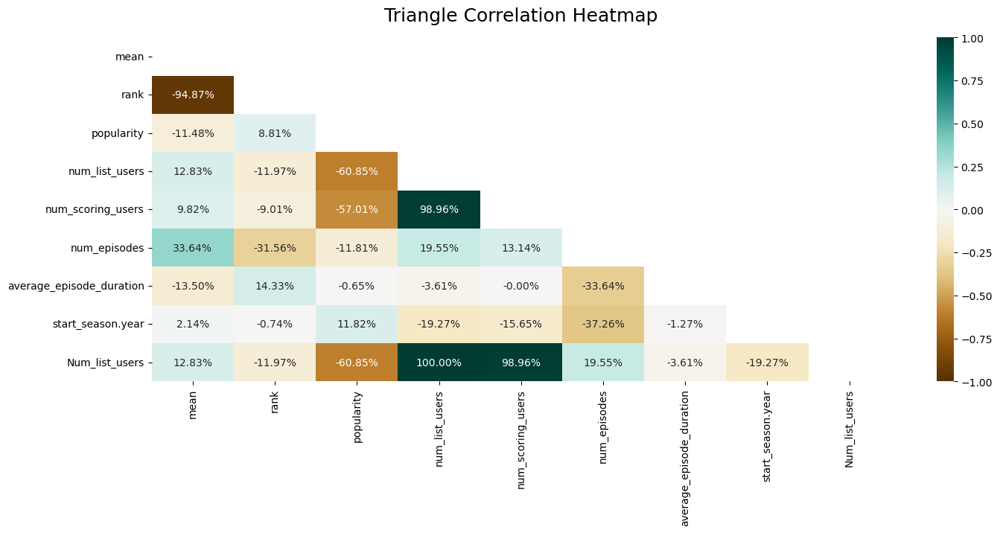

In [58]:
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(df_normalized.select_dtypes(exclude=['object']).corr().round(3), dtype=np.bool_))

heatmap = sns.heatmap(df_normalized.select_dtypes(exclude=['object']).corr(), mask=mask, vmin=-1, vmax=1, annot=True, fmt=".2%", cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

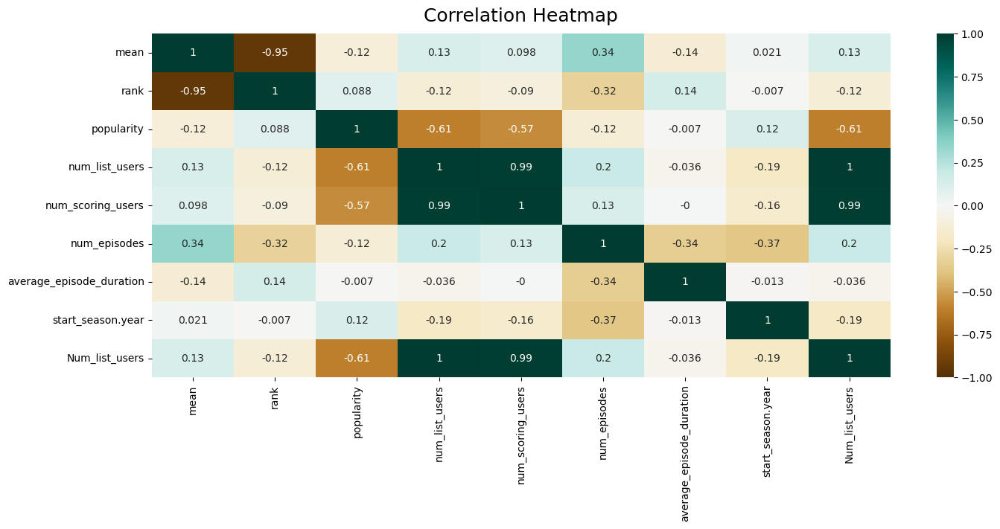

In [59]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df_normalized.select_dtypes(exclude=['object']).corr().round(3), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
# save heatmap as .png file
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

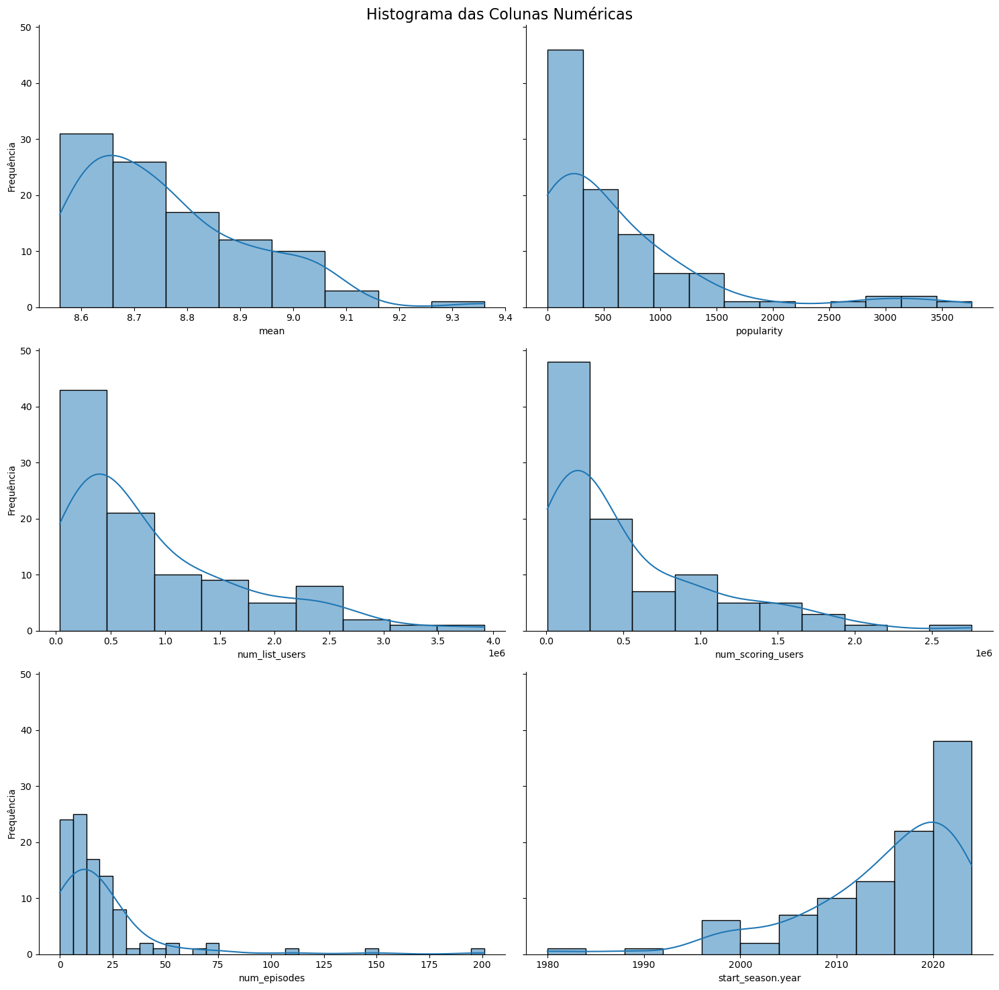

In [60]:
# Selecionar apenas as colunas numéricas
col_num = df_normalized[['mean', 'popularity', 'num_list_users', 'num_scoring_users',
       'num_episodes', 'start_season.year']]

# Criar subplots com 3 linhas e 2 colunas
fig, axes = plt.subplots(3, 2, figsize=(15, 15), sharey=True)

# Iterar sobre as colunas numéricas e criar os histogramas
for i, col in enumerate(col_num.columns):
    row, col_idx = divmod(i, 2)  # Calcular a posição do subplot
    sns.histplot(df_normalized[col], ax=axes[row, col_idx], kde=True)
    sns.despine(right=True, top=True)
    #col_name = ' '.join(col.split('.')[1:])
    #print(col_name)
    axes[row, col_idx].set_xlabel(col)
    axes[row, col_idx].set_ylabel('Frequência')
    

fig.suptitle('Histograma das Colunas Numéricas', fontsize=16)

# Ajustar o layout para evitar sobreposição
plt.tight_layout()
plt.show()


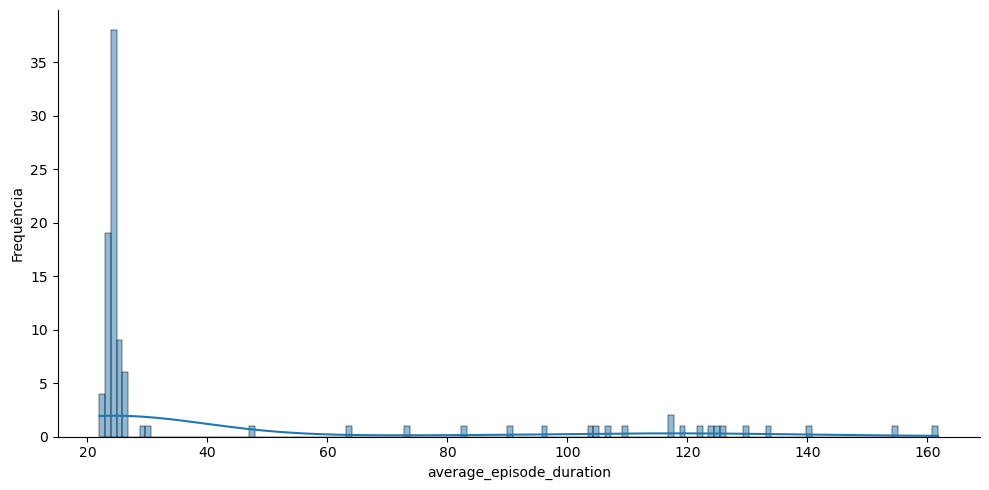

In [61]:
# Criar subplots com 1 linha e 1 coluna
fig, axes = plt.subplots(figsize=(10,5))

sns.histplot(df_normalized['average_episode_duration'], kde=True)
sns.despine(right=True, top=True)
axes.set_xlabel('average_episode_duration')
axes.set_ylabel('Frequência')

# Ajustar o layout para evitar sobreposição
plt.tight_layout()
plt.show()

In [62]:
colunas_categoricas = ['nsfw', 'media_type', 'source', 'rating', 'start_season.season', 'broadcast.day_of_the_week', 'genres', 'studios']

#

for col in colunas_categoricas:
    print(f'{col}: {df_normalized[col].unique()}')



nsfw: ['Safe for work' 'May be not safe for work']
media_type: ['tv' 'movie' 'ova' 'tv_special']
source: ['manga' 'visual_novel' 'novel' 'original' 'light_novel' 'web_manga'
 '4_koma_manga' 'web_novel' 'game']
rating: ['Teens 13 and Older' 'Violence and Profanity' 'Profanity and Mild Nudity'
 'Children' 'All ages']
start_season.season: ['fall' 'spring' 'winter' 'summer']
broadcast.day_of_the_week: ['friday' 'sunday' 'wednesday' 'monday' 'thursday' 'tuesday' 'saturday']
genres: ['Adventure' 'Action' 'Drama' 'Adult Cast' 'Comedy' 'Award Winning'
 'Childcare' 'CGDCT' 'School' 'Combat Sports' 'Iyashikei' 'Psychological']
studios: ['Madhouse' 'Bones' 'White Fox' 'Bandai Namco Pictures' 'Wit Studio'
 'Sunrise' 'K-Factory' 'Pierrot' 'A-1 Pictures' 'TMS Entertainment'
 'Kyoto Animation' 'Shaft' 'OLM' 'MAPPA' 'Shin-Ei Animation'
 'CoMix Wave Films' 'CloverWorks' 'Production I.G' 'Studio Ghibli'
 'Toei Animation' 'ufotable' 'LAN Studio' 'Artland' 'Tokyo Movie Shinsha'
 'Studio Deen' 'Red Dog Cul

In [63]:
one_hot_enc = make_column_transformer(
    (OneHotEncoder(handle_unknown = 'error', sparse_output=False), colunas_categoricas), remainder='passthrough')

dados = one_hot_enc.fit_transform(df_normalized)
dados = pd.DataFrame(dados, columns=one_hot_enc.get_feature_names_out(), index=df_normalized.index)
dados

,onehotencoder__nsfw_May be not safe for work,onehotencoder__nsfw_Safe for work,onehotencoder__media_type_movie,onehotencoder__media_type_ova,onehotencoder__media_type_tv,onehotencoder__media_type_tv_special,onehotencoder__source_4_koma_manga,onehotencoder__source_game,onehotencoder__source_light_novel,onehotencoder__source_manga,...,remainder__background,remainder__alternative_titles.en,remainder__start_season.year,remainder__broadcast.start_time,remainder__Watching,remainder__Completed,remainder__On_hold,remainder__Dropped,remainder__Plan_to_watch,remainder__Num_list_users
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,Sousou no Frieren was released on Blu-ray and ...,Frieren: Beyond Journey's End,2023,23:00,222964,364222,11670,7885,158077,764818
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,,Fullmetal Alchemist: Brotherhood,2009,17:00,260058,2428678,113035,59559,498399,3359729
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,Steins;Gate is based on 5pb. and Nitroplus' vi...,Steins;Gate,2011,02:05,168047,1615173,89510,56248,645408,2574386
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,,Gintama Season 4,2015,18:00,68906,265532,24673,18926,255788,633825
4,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,Shingeki no Kyojin Season 3 Part 2 adapts cont...,Attack on Titan Season 3 Part 2,2019,00:10,79765,2064129,9329,7541,130442,2291206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,,Natsume's Book of Friends Season 3,2011,01:30,9787,157128,4755,2599,79565,253834
96,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,Ookami Kodomo no Ame to Yuki won the 2013 Jap...,Wolf Children,2012,21:00,16045,590783,4699,1863,203483,816873
97,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,JoJo no Kimyou na Bouken: Ougon no Kaze is a f...,JoJo's Bizarre Adventure: Golden Wind,2018,01:05,77887,812304,17202,10251,113807,1031451
98,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,Natsume Yuujinchou Go was released on Blu-ray ...,Natsume's Book of Friends Season 5,2016,01:35,10745,100651,3659,2090,70357,187502


In [64]:
dados.filter(like='remainder').columns
one_hot_corr = dados[['remainder__mean', 'remainder__rank', 'onehotencoder__studios_A-1 Pictures',
 'onehotencoder__studios_Artland',
 'onehotencoder__studios_Bandai Namco Pictures',
 'onehotencoder__studios_Bones',
 "onehotencoder__studios_Brain's Base",
 'onehotencoder__studios_CloverWorks',
 'onehotencoder__studios_CoMix Wave Films',
 'onehotencoder__studios_David Production',
 'onehotencoder__studios_Doga Kobo',
 'onehotencoder__studios_Gainax',
 'onehotencoder__studios_K-Factory',
 'onehotencoder__studios_Khara',
 'onehotencoder__studios_Kinema Citrus',
 'onehotencoder__studios_Kyoto Animation',
 'onehotencoder__studios_LAN Studio',
 'onehotencoder__studios_MAPPA',
 'onehotencoder__studios_Madhouse',
 'onehotencoder__studios_OLM',
 'onehotencoder__studios_Pierrot',
 'onehotencoder__studios_Production I.G',
 'onehotencoder__studios_Red Dog Culture House',
 'onehotencoder__studios_Shaft',
 'onehotencoder__studios_Shin-Ei Animation',
 'onehotencoder__studios_Shuka',
 'onehotencoder__studios_Studio Bind',
 'onehotencoder__studios_Studio Chizu',
 'onehotencoder__studios_Studio Deen',
 'onehotencoder__studios_Studio Ghibli',
 'onehotencoder__studios_Sunrise',
 'onehotencoder__studios_TMS Entertainment',
 'onehotencoder__studios_Tatsunoko Production',
 'onehotencoder__studios_Toei Animation',
 'onehotencoder__studios_Tokyo Movie Shinsha',
 'onehotencoder__studios_Trigger',
 'onehotencoder__studios_White Fox',
 'onehotencoder__studios_Wit Studio',
 'onehotencoder__studios_ufotable']]

In [65]:
one_hot_corr.corr().round(3)

,remainder__mean,remainder__rank,onehotencoder__studios_A-1 Pictures,onehotencoder__studios_Artland,onehotencoder__studios_Bandai Namco Pictures,onehotencoder__studios_Bones,onehotencoder__studios_Brain's Base,onehotencoder__studios_CloverWorks,onehotencoder__studios_CoMix Wave Films,onehotencoder__studios_David Production,...,onehotencoder__studios_Studio Ghibli,onehotencoder__studios_Sunrise,onehotencoder__studios_TMS Entertainment,onehotencoder__studios_Tatsunoko Production,onehotencoder__studios_Toei Animation,onehotencoder__studios_Tokyo Movie Shinsha,onehotencoder__studios_Trigger,onehotencoder__studios_White Fox,onehotencoder__studios_Wit Studio,onehotencoder__studios_ufotable
remainder__mean,1.000,-0.949,-0.012,-0.120,0.283,0.065,-0.141,-0.068,0.051,-0.121,...,-0.071,0.231,0.134,-0.089,-0.018,-0.026,-0.102,0.198,0.052,-0.108
remainder__rank,-0.949,1.000,0.001,0.115,-0.277,-0.071,0.168,0.064,-0.078,0.165,...,0.040,-0.244,-0.127,0.103,-0.017,0.005,0.124,-0.165,-0.050,0.107
onehotencoder__studios_A-1 Pictures,-0.012,0.001,1.000,-0.047,-0.053,-0.047,-0.033,-0.033,-0.023,-0.023,...,-0.040,-0.063,-0.023,-0.023,-0.033,-0.023,-0.023,-0.023,-0.040,-0.040
onehotencoder__studios_Artland,-0.120,0.115,-0.047,1.000,-0.047,-0.042,-0.029,-0.029,-0.021,-0.021,...,-0.036,-0.056,-0.021,-0.021,-0.029,-0.021,-0.021,-0.021,-0.036,-0.036
onehotencoder__studios_Bandai Namco Pictures,0.283,-0.277,-0.053,-0.047,1.000,-0.047,-0.033,-0.033,-0.023,-0.023,...,-0.040,-0.063,-0.023,-0.023,-0.033,-0.023,-0.023,-0.023,-0.040,-0.040
onehotencoder__studios_Bones,0.065,-0.071,-0.047,-0.042,-0.047,1.000,-0.029,-0.029,-0.021,-0.021,...,-0.036,-0.056,-0.021,-0.021,-0.029,-0.021,-0.021,-0.021,-0.036,-0.036
onehotencoder__studios_Brain's Base,-0.141,0.168,-0.033,-0.029,-0.033,-0.029,1.000,-0.020,-0.014,-0.014,...,-0.025,-0.039,-0.014,-0.014,-0.020,-0.014,-0.014,-0.014,-0.025,-0.025
onehotencoder__studios_CloverWorks,-0.068,0.064,-0.033,-0.029,-0.033,-0.029,-0.020,1.000,-0.014,-0.014,...,-0.025,-0.039,-0.014,-0.014,-0.020,-0.014,-0.014,-0.014,-0.025,-0.025
onehotencoder__studios_CoMix Wave Films,0.051,-0.078,-0.023,-0.021,-0.023,-0.021,-0.014,-0.014,1.000,-0.010,...,-0.018,-0.028,-0.010,-0.010,-0.014,-0.010,-0.010,-0.010,-0.018,-0.018
onehotencoder__studios_David Production,-0.121,0.165,-0.023,-0.021,-0.023,-0.021,-0.014,-0.014,-0.010,1.000,...,-0.018,-0.028,-0.010,-0.010,-0.014,-0.010,-0.010,-0.010,-0.018,-0.018


In [66]:
print(len(df_normalized['studios'].unique()))

37


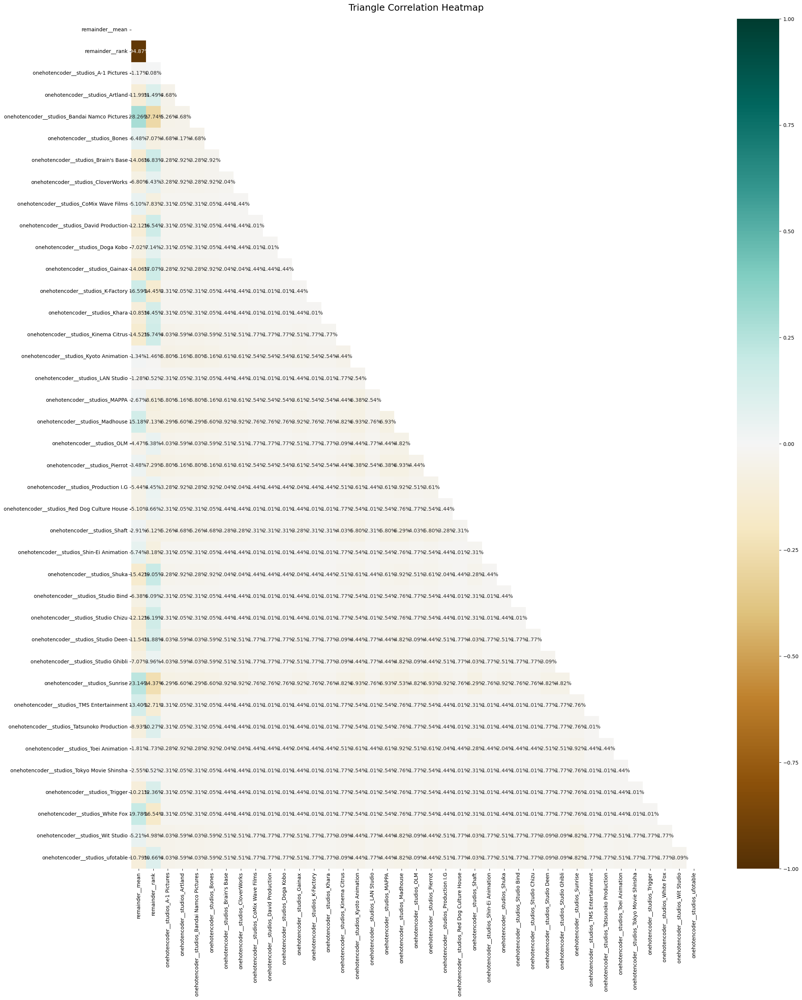

In [67]:
plt.figure(figsize=(25, 30))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(one_hot_corr.corr(), dtype=np.bool_))

heatmap = sns.heatmap(one_hot_corr.corr(), mask=mask, vmin=-1, vmax=1, annot=True, fmt=".2%", cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

In [68]:
#one_hot_data = pd.get_dummies(dados)
one_hot_data = pd.get_dummies(dados.filter(like='onehotencoder').columns)


In [69]:
'''
plt.figure(figsize=(16, 6))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(one_hot_data.corr(), dtype=np.bool_))

heatmap = sns.heatmap(one_hot_data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, fmt=".2%", cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);
'''

'\nplt.figure(figsize=(16, 6))\n# define the mask to set the values in the upper triangle to True\nmask = np.triu(np.ones_like(one_hot_data.corr(), dtype=np.bool_))\n\nheatmap = sns.heatmap(one_hot_data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, fmt=".2%", cmap=\'BrBG\')\nheatmap.set_title(\'Triangle Correlation Heatmap\', fontdict={\'fontsize\':18}, pad=16);\n'

In [70]:
'''
def get_mae(X, y):
    # multiple by -1 to make positive MAE score instead of neg value returned as sklearn convention
    return -1 * cross_val_score(RandomForestRegressor(50), 
                                X, y, 
                                scoring = 'neg_mean_absolute_error').mean()

mae_one_hot_encoded = get_mae(one_hot_data, target)

print('Mean Abslute Error with One-Hot Encoding: ' + str(int(mae_one_hot_encoded)))
'''

"\ndef get_mae(X, y):\n    # multiple by -1 to make positive MAE score instead of neg value returned as sklearn convention\n    return -1 * cross_val_score(RandomForestRegressor(50), \n                                X, y, \n                                scoring = 'neg_mean_absolute_error').mean()\n\nmae_one_hot_encoded = get_mae(one_hot_data, target)\n\nprint('Mean Abslute Error with One-Hot Encoding: ' + str(int(mae_one_hot_encoded)))\n"

In [71]:
#one_hot_data.filter.corr()

In [72]:
df_normalized_ajust = df_normalized.copy()
df_normalized_ajust.drop(['title', 'start_date', 'background', 'end_date', 'synopsis', 'alternative_titles.en', 'Watching', 'Completed', 'On_hold', 'Dropped', 'Plan_to_watch'], axis=1, inplace=True)

In [73]:
df_normalized_ajust.columns

Index(['mean', 'rank', 'popularity', 'num_list_users', 'num_scoring_users',
       'nsfw', 'media_type', 'status', 'num_episodes', 'source',
       'average_episode_duration', 'rating', 'start_season.year',
       'start_season.season', 'broadcast.day_of_the_week',
       'broadcast.start_time', 'Num_list_users', 'genres', 'studios'],
      dtype='object')

In [74]:
for col in df_normalized_ajust.select_dtypes(include=['object']).columns:
    print(f'{col}: {df_normalized_ajust[col].unique()}')

nsfw: ['Safe for work' 'May be not safe for work']
media_type: ['tv' 'movie' 'ova' 'tv_special']
status: ['finished_airing' 'currently_airing']
source: ['manga' 'visual_novel' 'novel' 'original' 'light_novel' 'web_manga'
 '4_koma_manga' 'web_novel' 'game']
rating: ['Teens 13 and Older' 'Violence and Profanity' 'Profanity and Mild Nudity'
 'Children' 'All ages']
start_season.season: ['fall' 'spring' 'winter' 'summer']
broadcast.day_of_the_week: ['friday' 'sunday' 'wednesday' 'monday' 'thursday' 'tuesday' 'saturday']
broadcast.start_time: ['23:00' '17:00' '02:05' '18:00' '00:10' '21:00' '10:55' '00:00' '01:35'
 '01:30' '01:59' '01:05' '00:40' '23:56' '00:30' '01:55' '00:50' '00:05'
 '01:00' '23:15' '09:30' '02:25' '01:25' '19:30' '01:29' '03:40' '02:00'
 '21:30' '01:20' '23:30' '22:30' '08:30' '00:35' '00:56' '02:58' '01:45']
genres: ['Adventure' 'Action' 'Drama' 'Adult Cast' 'Comedy' 'Award Winning'
 'Childcare' 'CGDCT' 'School' 'Combat Sports' 'Iyashikei' 'Psychological']
studios: ['Ma

In [75]:
import pandas as pd
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder

# Definir as colunas categóricas
cat_col = ['nsfw', 'media_type', 'status', 'source', 'rating', 'start_season.season', 'broadcast.day_of_the_week', 'broadcast.start_time', 'genres', 'studios']

# Criar o transformador de colunas
one_hot_enc = make_column_transformer((OneHotEncoder(handle_unknown='ignore'), cat_col), remainder='passthrough')

# Aplicar o transformador ao DataFrame
dados_ohe = one_hot_enc.fit_transform(df_normalized_ajust)

# Verificar o shape do array transformado
print("Shape dos dados transformados:", dados_ohe.shape)

# Obter os nomes das colunas
col_names = one_hot_enc.get_feature_names_out()
print("Nomes das colunas geradas pelo OneHotEncoder:")
print(col_names)

# Garantir que o número de colunas gerado pelo OneHotEncoder corresponde ao esperado
assert dados_ohe.shape[1] == len(col_names), f"O número de colunas gerado ({dados_ohe.shape[1]}) não corresponde ao número esperado ({len(col_names)})."

# Criar um novo DataFrame com as colunas corretamente nomeadas
dados_ohe_df = pd.DataFrame(dados_ohe.toarray(), columns=col_names)

# Verificar informações do DataFrame
print(dados_ohe_df.info())

# Exibir o DataFrame resultante
dados_ohe_df.head()


Shape dos dados transformados: (100, 127)
Nomes das colunas geradas pelo OneHotEncoder:
['onehotencoder__nsfw_May be not safe for work'
 'onehotencoder__nsfw_Safe for work' 'onehotencoder__media_type_movie'
 'onehotencoder__media_type_ova' 'onehotencoder__media_type_tv'
 'onehotencoder__media_type_tv_special'
 'onehotencoder__status_currently_airing'
 'onehotencoder__status_finished_airing'
 'onehotencoder__source_4_koma_manga' 'onehotencoder__source_game'
 'onehotencoder__source_light_novel' 'onehotencoder__source_manga'
 'onehotencoder__source_novel' 'onehotencoder__source_original'
 'onehotencoder__source_visual_novel' 'onehotencoder__source_web_manga'
 'onehotencoder__source_web_novel' 'onehotencoder__rating_All ages'
 'onehotencoder__rating_Children'
 'onehotencoder__rating_Profanity and Mild Nudity'
 'onehotencoder__rating_Teens 13 and Older'
 'onehotencoder__rating_Violence and Profanity'
 'onehotencoder__start_season.season_fall'
 'onehotencoder__start_season.season_spring'
 'o

,onehotencoder__nsfw_May be not safe for work,onehotencoder__nsfw_Safe for work,onehotencoder__media_type_movie,onehotencoder__media_type_ova,onehotencoder__media_type_tv,onehotencoder__media_type_tv_special,onehotencoder__status_currently_airing,onehotencoder__status_finished_airing,onehotencoder__source_4_koma_manga,onehotencoder__source_game,...,onehotencoder__studios_ufotable,remainder__mean,remainder__rank,remainder__popularity,remainder__num_list_users,remainder__num_scoring_users,remainder__num_episodes,remainder__average_episode_duration,remainder__start_season.year,remainder__Num_list_users
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,9.36,1.0,256.0,764897.0,419474.0,28.0,24.500000,2023.0,764818.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,9.09,2.0,3.0,3359773.0,2128919.0,64.0,24.333333,2009.0,3359729.0
2,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,9.07,3.0,13.0,2574435.0,1405352.0,24.0,24.333333,2011.0,2574386.0
3,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,9.06,4.0,343.0,633834.0,252437.0,51.0,24.000000,2015.0,633825.0
4,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,9.05,5.0,21.0,2291242.0,1596894.0,10.0,23.916667,2019.0,2291206.0


In [76]:
dados_ohe_df.columns

Index(['onehotencoder__nsfw_May be not safe for work',
       'onehotencoder__nsfw_Safe for work', 'onehotencoder__media_type_movie',
       'onehotencoder__media_type_ova', 'onehotencoder__media_type_tv',
       'onehotencoder__media_type_tv_special',
       'onehotencoder__status_currently_airing',
       'onehotencoder__status_finished_airing',
       'onehotencoder__source_4_koma_manga', 'onehotencoder__source_game',
       ...
       'onehotencoder__studios_ufotable', 'remainder__mean', 'remainder__rank',
       'remainder__popularity', 'remainder__num_list_users',
       'remainder__num_scoring_users', 'remainder__num_episodes',
       'remainder__average_episode_duration', 'remainder__start_season.year',
       'remainder__Num_list_users'],
      dtype='object', length=127)

In [77]:
dados_ohe_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 127 entries, onehotencoder__nsfw_May be not safe for work to remainder__Num_list_users
dtypes: float64(127)
memory usage: 99.3 KB


In [78]:
dados_ohe_df.corr().round(3)

,onehotencoder__nsfw_May be not safe for work,onehotencoder__nsfw_Safe for work,onehotencoder__media_type_movie,onehotencoder__media_type_ova,onehotencoder__media_type_tv,onehotencoder__media_type_tv_special,onehotencoder__status_currently_airing,onehotencoder__status_finished_airing,onehotencoder__source_4_koma_manga,onehotencoder__source_game,...,onehotencoder__studios_ufotable,remainder__mean,remainder__rank,remainder__popularity,remainder__num_list_users,remainder__num_scoring_users,remainder__num_episodes,remainder__average_episode_duration,remainder__start_season.year,remainder__Num_list_users
onehotencoder__nsfw_May be not safe for work,1.000,-1.000,-0.052,-0.023,0.063,-0.014,-0.014,0.014,-0.010,-0.010,...,-0.018,0.057,-0.082,0.090,-0.088,-0.080,-0.025,-0.054,0.110,-0.088
onehotencoder__nsfw_Safe for work,-1.000,1.000,0.052,0.023,-0.063,0.014,0.014,-0.014,0.010,0.010,...,0.018,-0.057,0.082,-0.090,0.088,0.080,0.025,0.054,-0.110,0.088
onehotencoder__media_type_movie,-0.052,0.052,1.000,-0.118,-0.827,-0.074,-0.074,0.074,-0.052,-0.052,...,0.197,-0.162,0.176,0.026,-0.059,-0.018,-0.348,0.939,0.001,-0.059
onehotencoder__media_type_ova,-0.023,0.023,-0.118,1.000,-0.368,-0.033,-0.033,0.033,-0.023,0.438,...,-0.040,-0.017,0.014,0.160,-0.153,-0.147,0.074,-0.106,-0.115,-0.153
onehotencoder__media_type_tv,0.063,-0.063,-0.827,-0.368,1.000,-0.229,0.089,-0.089,0.063,-0.161,...,-0.151,0.122,-0.126,-0.091,0.148,0.107,0.304,-0.805,0.027,0.148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
remainder__num_scoring_users,-0.080,0.080,-0.018,-0.147,0.107,-0.064,0.037,-0.037,-0.033,-0.003,...,0.057,0.098,-0.090,-0.570,0.990,1.000,0.131,-0.000,-0.157,0.990
remainder__num_episodes,-0.025,0.025,-0.348,0.074,0.304,-0.079,-0.069,0.069,-0.029,-0.036,...,-0.098,0.336,-0.316,-0.118,0.195,0.131,1.000,-0.336,-0.373,0.195
remainder__average_episode_duration,-0.054,0.054,0.939,-0.106,-0.805,0.016,-0.071,0.071,-0.052,-0.048,...,0.207,-0.135,0.143,-0.007,-0.036,-0.000,-0.336,1.000,-0.013,-0.036
remainder__start_season.year,0.110,-0.110,0.001,-0.115,0.027,0.089,-0.056,0.056,0.086,0.086,...,0.123,0.021,-0.007,0.118,-0.193,-0.157,-0.373,-0.013,1.000,-0.193


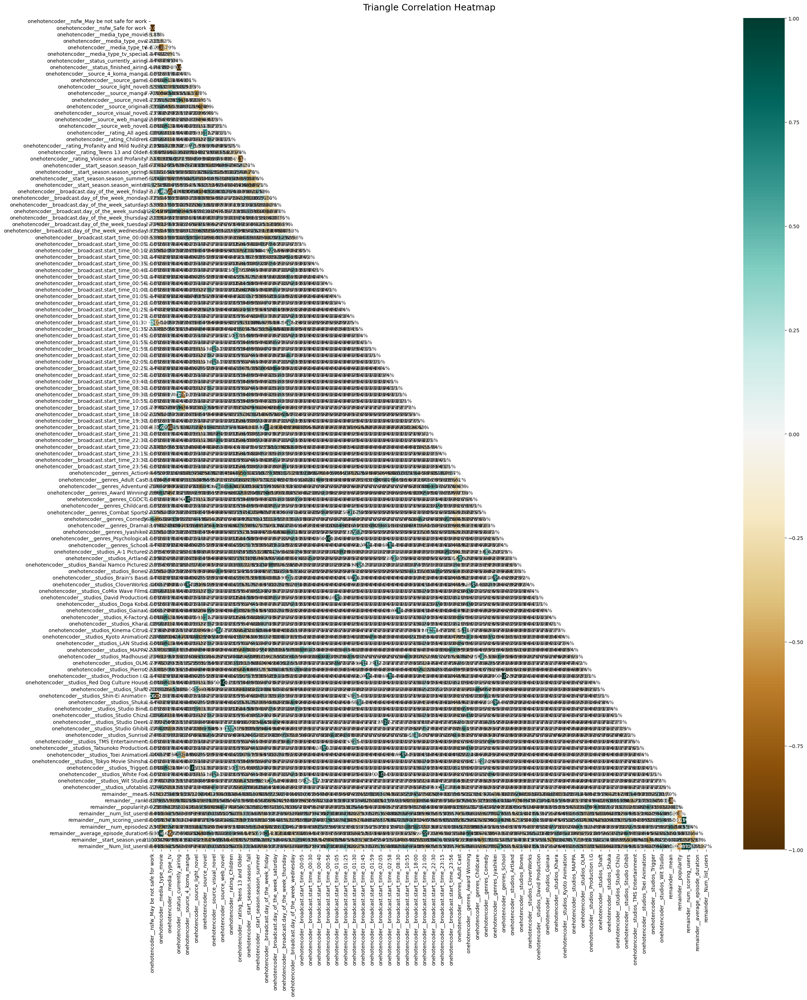

In [79]:
plt.figure(figsize=(25, 30))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(dados_ohe_df.corr(), dtype=np.bool_))

heatmap = sns.heatmap(dados_ohe_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, fmt=".2%", cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

In [80]:
dados_ohe_df.columns

Index(['onehotencoder__nsfw_May be not safe for work',
       'onehotencoder__nsfw_Safe for work', 'onehotencoder__media_type_movie',
       'onehotencoder__media_type_ova', 'onehotencoder__media_type_tv',
       'onehotencoder__media_type_tv_special',
       'onehotencoder__status_currently_airing',
       'onehotencoder__status_finished_airing',
       'onehotencoder__source_4_koma_manga', 'onehotencoder__source_game',
       ...
       'onehotencoder__studios_ufotable', 'remainder__mean', 'remainder__rank',
       'remainder__popularity', 'remainder__num_list_users',
       'remainder__num_scoring_users', 'remainder__num_episodes',
       'remainder__average_episode_duration', 'remainder__start_season.year',
       'remainder__Num_list_users'],
      dtype='object', length=127)

In [91]:
x = dados_ohe_df.drop(['remainder__mean'], axis=1)
y = dados_ohe_df['remainder__mean']

In [92]:
def metricas(y_test, y_pred):
    print(f'Acurácia: ', metrics.accuracy_score(y_test, y_pred))
    print(f'Precisão: ', metrics.precision_score(y_test, y_pred, average='micro'))
    print(f'Recall: ', metrics.recall_score(y_test, y_pred, average='micro'))
    print(f'F1: ', metrics.f1_score(y_test, y_pred, average='micro'))
    
def conf_matrix(cm, y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix = cm)
    disp.plot()

In [93]:
seed = 42

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=seed)

In [96]:
model = DecisionTreeClassifier(max_depth=5, random_state=seed)

model.fit(x_train, y_train)
y_pred = model.predict(x_test)
metricas(y_test, y_pred)

ValueError: Number of labels=100 does not match number of samples=75